# circle illusion 動画の再現

### 元ネタ
[crazy circle illusion!](https://www.youtube.com/watch?v=pNe6fsaCVtI&feature=youtu.be) on YouTube

---

### ライブラリ

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.lines as lines
from matplotlib.animation import ArtistAnimation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

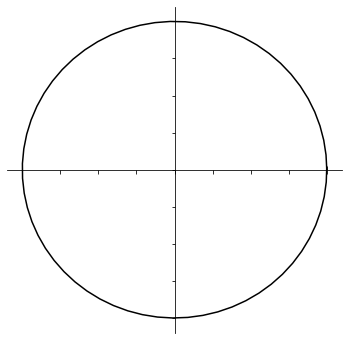

In [2]:
# π
PI = np.pi

# 円
def circle(th):
    x = np.cos(th)
    y = np.sin(th)
    return x, y


# まず縁を描画する
start = 0
last = 2*PI
dx = 0.1 # 間隔

theta = np.arange(start, last, dx)
x, y = circle(theta)

c_theta = np.arange(start, last+dx, dx)
c_x, c_y = circle(c_theta)


plt.figure(figsize=(6,6))
plt.plot(c_x, c_y, color='black')

# 軸
## 右と上は消す
## 左と下は原点基準に
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_position('zero')
plt.gca().spines['bottom'].set_position('zero')

# メモリのラベルを消す
plt.tick_params(
    labelleft=False,
    labelbottom=False,
)
plt.show()

---

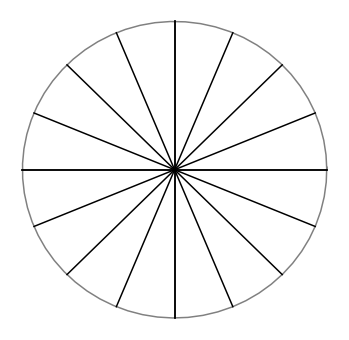

In [3]:
'''点が動くとこの線を引く'''

zeros = np.zeros_like(x)

points_x = []
points_y = []
for i in range(16):
    _theta = PI * 1/8 * i
    point_x, point_y = circle(_theta)
    points_x.append(point_x)
    points_y.append(point_y)



plt.figure(figsize=(6,6))

# 軸
## 右と上は消す
## 左と下は原点基準に
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# メモリのラベルを消す
plt.tick_params(
    left=False,
    bottom=False,
    labelleft=False,
    labelbottom=False,
)


plt.plot(c_x, c_y, color='gray')
for i in range(8):
    plt.plot([points_x[i], points_x[i+8]], [points_y[i], points_y[i+8]], color='black')
plt.plot([1, -1], [0, 0], color='black')
plt.plot([0, 0], [1, -1], color='black')

---

In [4]:
"""書き方を少し変える"""

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1)

# 軸
## 右と上は消す
## 左と下は原点基準に
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# メモリのラベルを消す
ax.tick_params(
    left=False,
    bottom=False,
    labelleft=False,
    labelbottom=False,
)

ax.plot(c_x, c_y, color='gray')
for i in range(8):
    ax.plot([points_x[i], points_x[i+8]], [points_y[i], points_y[i+8]], color='gray')
ax.plot([1, -1], [0, 0], color='gray')
ax.plot([0, 0], [1, -1], color='gray')




'''x軸とy軸を動く点を描画'''

art_list = []

for i in range(len(theta)):
    art = plt.plot(x[i], 0, marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(0, y[i], marker='o', markersize=8, color='black', linestyle='None')
    art_list.append(art)


anim = ArtistAnimation(fig, art_list, interval=50)
plt.close()
HTML(anim.to_jshtml())

---

In [5]:
'''角度をずらす'''

# x軸とy軸上を動く点の座標を格納
on_axis_x = [[p_x, 0] for p_x in x]
on_axis_y = [[0, p_y] for p_y in y]


# 変換用の行列
def matrix(th):
    matrix = [[np.cos(th), -1*np.sin(th)], [np.sin(th), np.cos(th)]]
    return matrix


angle = np.arange(1/8, 1/2, 1/8) # 1/8から1/2まで1/8の間隔
# --> [0.125, 0.25, 0.375]


# radianに変換
radians = []
for an in angle:
    angl = math.degrees(PI * an)
    rad = math.radians(angl)
    radians.append(rad)
# --> [0.39269908169872414, 0.7853981633974483, 1.1780972450961724]



# 変換用の関数

def angle_transform(angle):
    transform_x = [np.dot(matrix(angle), on_x) for on_x in on_axis_x]
    transform_y = [np.dot(matrix(angle), on_y) for on_y in on_axis_y]
    return transform_x, transform_y


x_1, y_1 = angle_transform(radians[0])
x_2, y_2 = angle_transform(radians[1])
x_3, y_3 = angle_transform(radians[2])

In [6]:
"""角度をずらした点を描画"""

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1)

# 軸
## 右と上は消す
## 左と下は原点基準に
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# メモリのラベルを消す
ax.tick_params(
    left=False,
    bottom=False,
    labelleft=False,
    labelbottom=False,
)

ax.plot(c_x, c_y, color='gray')
for i in range(8):
    ax.plot([points_x[i], points_x[i+8]], [points_y[i], points_y[i+8]], color='gray')
ax.plot([1, -1], [0, 0], color='gray')
ax.plot([0, 0], [1, -1], color='gray')



art_list = []

for i in range(len(theta)):
    art = plt.plot(x[i], 0, marker='o', markersize=8, color='gray', linestyle='None')
    art += plt.plot(0, y[i], marker='o', markersize=8, color='gray', linestyle='None')


    '''新しく追加'''

    art += plt.plot(x_1[i][0], x_1[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(y_1[i][0], y_1[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(x_2[i][0], x_2[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(y_2[i][0], y_2[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(x_3[i][0], x_3[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(y_3[i][0], y_3[i][1], marker='o', markersize=8, color='black', linestyle='None')

    '''ここまで'''

    art_list.append(art)


anim = ArtistAnimation(fig, art_list, interval=50)
plt.close()
HTML(anim.to_jshtml())

---

In [7]:
'''
位相をずらす
配列のケツを4つ単位で頭に持ってくる
'''

# 位相をずらす関数

def change_phase(ary, n):

    # ケツを指定した数取り出す
    tail_n = ary[-n::]

    # ケツ n個分消す
    del_tail_n = np.delete(ary, slice(-n, None, None), 0)

    # 取り出したケツ部分を先頭に付け足す
    new_ary = np.append(tail_n, del_tail_n, axis=0)

    return new_ary


new_x_1 = change_phase(x_1, 4)
new_y_1 = change_phase(y_1, 4)
new_x_2 = change_phase(x_2, 8)
new_y_2 = change_phase(y_2, 8)
new_x_3 = change_phase(x_3, 12)
new_y_3 = change_phase(y_3, 12)

In [8]:
"""角度をずらした点を描画"""

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1)

# 軸
## 右と上は消す
## 左と下は原点基準に
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# メモリのラベルを消す
ax.tick_params(
    left=False,
    bottom=False,
    labelleft=False,
    labelbottom=False,
)

ax.plot(c_x, c_y, color='gray')
for i in range(8):
    ax.plot([points_x[i], points_x[i+8]], [points_y[i], points_y[i+8]], color='gray')
ax.plot([1, -1], [0, 0], color='gray')
ax.plot([0, 0], [1, -1], color='gray')



art_list = []

for i in range(len(theta)):
    art = plt.plot(x[i], 0, marker='o', markersize=8, color='gray', linestyle='None')
    art += plt.plot(0, y[i], marker='o', markersize=8, color='gray', linestyle='None')


    '''新しく追加'''

    art += plt.plot(new_x_1[i][0], new_x_1[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_y_1[i][0], new_y_1[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_x_2[i][0], new_x_2[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_y_2[i][0], new_y_2[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_x_3[i][0], new_x_3[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_y_3[i][0], new_y_3[i][1], marker='o', markersize=8, color='black', linestyle='None')

    '''ここまで'''

    art_list.append(art)


anim = ArtistAnimation(fig, art_list, interval=50)
plt.close()
HTML(anim.to_jshtml())

## そろそろ完成

---

In [9]:
"""いらない線やらなんやら消す"""


fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1)

# 軸
## 右と上は消す
## 左と下は原点基準に
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# メモリのラベルを消す
ax.tick_params(
    left=False,
    bottom=False,
    labelleft=False,
    labelbottom=False,
)


ax.plot(c_x, c_y, color='black')



art_list = []

for i in range(len(theta)):
    art = plt.plot(x[i], 0, marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(0, y[i], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_x_1[i][0], new_x_1[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_y_1[i][0], new_y_1[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_x_2[i][0], new_x_2[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_y_2[i][0], new_y_2[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_x_3[i][0], new_x_3[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art += plt.plot(new_y_3[i][0], new_y_3[i][1], marker='o', markersize=8, color='black', linestyle='None')
    art_list.append(art)


anim = ArtistAnimation(fig, art_list, interval=50)
plt.close()
HTML(anim.to_jshtml())

In [10]:
# 保存
#anim.save('./circle_illusion.gif', writer="imagemagick") # gif動画として保存。
#anim.save('./circle_illusion.mp4', writer="ffmpeg") # mp4で保存